In [1]:
import loompy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os, os.path
from scipy import sparse
import tomotopy as tt

# suppress INFO
import logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)

# Functions to construct topic models

In [2]:
def list_model_genes(model):
    """ List the most contributing genes in each topic """
    e2g = { v:k for k,v in [l.strip().split('\t') for l in open("genename2ensg.tab")] }
    for i in range(k):
        print("Topic %s:" % i)
        topicwords = model.get_topic_words(i, top_n=5)
        for t in topicwords:
            g = e2g[t[0]] if t[0] in e2g else t[0]
            print("%8s:%.4f" % (g,t[1]), end=" ")
        print()

def show_topic_distro(model, k, bins=1000, fromto=(0.1, 1), requested_percentile = 99):
    topics = np.vstack([model.get_topic_word_dist(i, normalize=False) for i in range(k)])
    total_per_gene = topics.sum(axis=0)
    normed_topics = topics / total_per_gene
    plt.figure(None, (20, 5))
    plt.hist(normed_topics.flatten(), bins=bins, range=fromto)
    rp = np.percentile(normed_topics.flatten(), requested_percentile)
    plt.vlines(rp, 0, 250, color='orange')
    plt.title("%s percentile = %s" % (requested_percentile, rp))
    plt.show()

# Functions to apply model on Xenium data

In [3]:
def save_loadings_to_loom(transformed, modelname, k, loompath):
    with loompy.connect(loompath) as ds:
        tp_attr = "TP_%s_%s" % (k, modelname)
        print("Saving topic loading in %s as col attr %s" % (loompath, tp_attr))
        ds.ca[tp_attr] = transformed

def read_loadings_from_loom(modelname, k, loompath):
    with loompy.connect(loompath, 'r') as ds:
        tp_attr = "TP_%s_%s" % (k, modelname)
        return ds.ca[tp_attr] if tp_attr in ds.ca else None

def calc_loadings_on_xeniumloom(model, loompath, selected_genes_file=None):
    with loompy.connect(loompath, 'r') as ds:
        print("Shape of %s: %s" % (loompath, str(ds.shape)))
        # If Accessions are missing, we need to use a translation table from Gene name to Accessions (ENSGxxx)
        if 'Accession' in ds.ra and ds.ra.Accession[0].startswith("ENSG"):
            accessions = np.array(ds.ra.Accession[:])
        else:
            g2e = { g:e for g,e in [l.strip().split('\t') for l in open("genename2ensg.tab")] }
            accessions = np.array([ (g2e[g] if g in g2e else g) for g in ds.ra.Gene ])
        # use only genes in the pre-fit model
        selected_genes = pd.Series(accessions).isin(list(model.vocabs)).to_numpy()
        selected_genes = np.where(selected_genes)[0]
        selected_accessions = accessions[selected_genes]
        if selected_genes_file:
            e2g = { e:g for g,e in [l.strip().split('\t') for l in open("genename2ensg.tab")] }
            with open(selected_genes_file, 'w') as sgfd:
                print('Writing selected genes to %s' % selected_genes_file)
                sgfd.write(''.join( ["%s\t%s\t%s\n" % (e,a,(e2g[e] if e in e2g else e)) \
                                     for e,a in zip(selected_genes, selected_accessions)]))
        data = ds.sparse(rows=selected_genes).A
        n_cells = ds.shape[1]
        print("%s selected genes x %s cells" % data.shape)
        corpus = tt.utils.Corpus()
        empty_doc_idxs = []
        for i in range(n_cells):
            doc = list(np.repeat(selected_accessions, data[:, i].astype('int').T, axis=0))
            if len(doc) == 0:
                print("Empty cell at index %s" % i)
                empty_doc_idxs.append(i)
            else:
                corpus.add_doc(doc)
        transformed = model.infer(corpus, together=False)[0]
        transformed = np.vstack([doc.get_topic_dist() for doc in transformed])
        for i in empty_doc_idxs:
            transformed = np.insert(transformed, i, 0.0, axis=0)
    print("Done.")
    return transformed

def get_loadings(modelfolder, modelname, k, loompath, recalc_loadings=False, selected_genes_file=None):
    transformed = read_loadings_from_loom(modelname, k, loompath)
    if recalc_loadings or transformed is None:
        print("Calculating loadings ...")
        model = tt.LDAModel.load('HumanAdult_Recombined3Clean2_C_FBPC_35topics_model.bin')
        transformed = calc_loadings_on_xeniumloom(model, loompath, selected_genes_file)
        save_loadings_to_loom(transformed, modelname, k, loompath)
    return transformed

def colorize_umap(transformed, loompath, outfolder=None, normalize=True):
    """ Colorize the UMAP with the loading of each topic on the cells """
    plt.figure(None, (20, 20), facecolor='white')
    gs = plt.GridSpec(5, k // 5)
    with loompy.connect(loompath, 'r') as ds:
        for i in range(k):
            plt.subplot(gs[i])
            weights = transformed[:,i]
            if normalize:
                weights = weights / max(weights)
            plt.scatter(ds.ca.UMAP[:, 0], ds.ca.UMAP[:, 1], c=weights, alpha=0.5, s=5, lw=0, \
                        rasterized=True, cmap='inferno_r')
            plt.axis('off')
            plt.title("Topic %s (%.3f-%.3f)" % (i, min(weights), max(weights)), fontsize=12)
            plt.margins(0.05, 0.05)
    if outfolder:
        os.makedirs(outfolder, exist_ok=True)
        plt.savefig(outfolder + '/LDA_on_UMAP.png', dpi=300)
    plt.show()
            
def colorize_xenium_replicates(transformed, loompath, outfolder=None):
    """ Colorize the Xenium image or multiple replicates with the loading of each topic on the cells """
    with loompy.connect(loompath, 'r') as ds:
        if 'replicate' in ds.ca:
            replicates = list(set(ds.ca.replicate))
            print("Replicates to colorize: %s" % replicates)
            reps = [ (r, ds.ca.replicate == r) for r in replicates]
        else:
            reps = [ (os.path.basename(loompath), np.full(ds.shape[1], True)) ]
        for replicate, replicateidx in reps:
            fig = plt.figure(None, (20, 20), facecolor='white')
            gs = plt.GridSpec(5, k // 5)
            xs = ds.ca.x_centroid[replicateidx]
            ys = ds.ca.y_centroid[replicateidx]
            for i in range(k):
                plt.subplot(gs[i])
                weights = transformed[replicateidx,i]
                weights = weights / max(weights)
                plt.scatter(xs, ys, c=weights, alpha=0.5, s=5, lw=0, rasterized=True, cmap='inferno_r')
                plt.axis('off')
                plt.title("Topic %s (%.3f - %.3f)" % (i, min(weights), max(weights)), fontsize=12)
                plt.margins(0.05, 0.05)
            fig.suptitle(replicate, fontsize='xx-large', va='bottom')
            if outfolder:
                os.makedirs(outfolder, exist_ok=True)
                plt.savefig(outfolder + '/Xenium_%s_topics.png' % replicate, dpi=300)
            plt.show()

In [4]:
k = 35
modelname = 'Recombined3Clean2_C_FBPC'
modelfolder = './' + modelname

In [6]:
loompath = 'adata_meningioma_M46.loom'
outfolder = None #modelname + '/' + str(k)
transformed = get_loadings(modelfolder, modelname, k, loompath)

Replicates to colorize: ['M46']


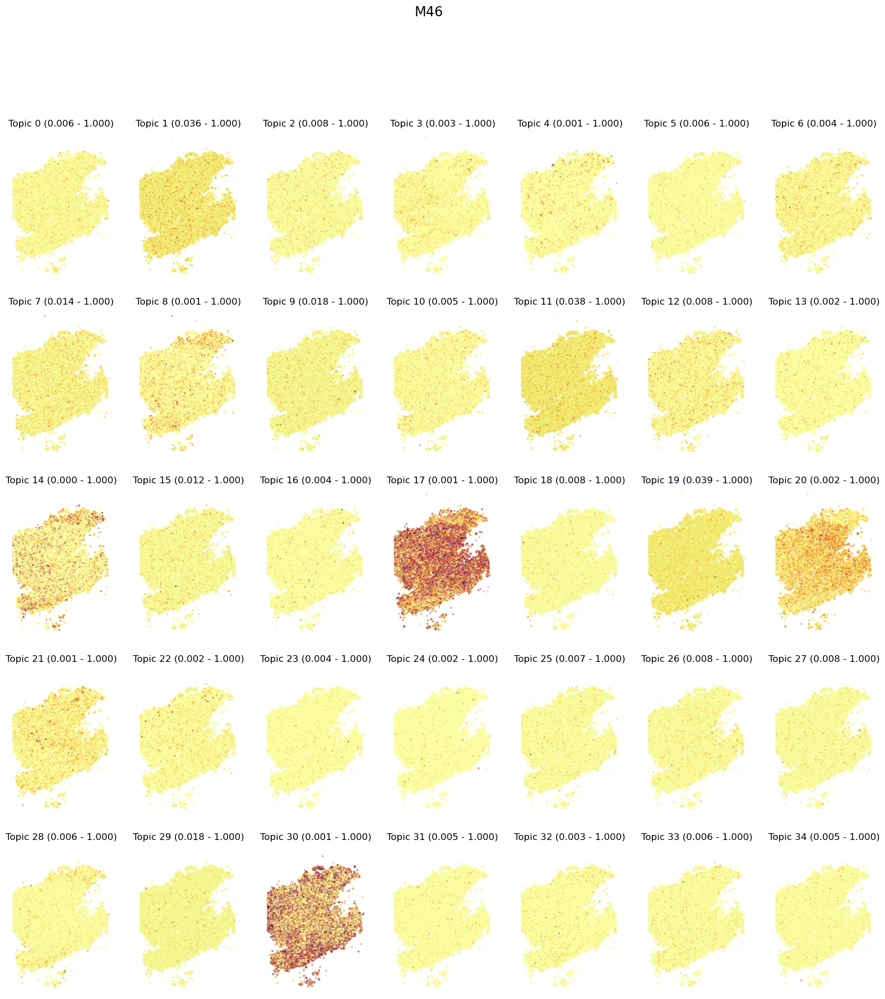

In [7]:
colorize_xenium_replicates(transformed, loompath, outfolder)

Calculating loadings ...
Shape of adata_SL123_all_leiden.loom: (541, 203193)
306 selected genes x 203193 cells
Done.
Saving topic loading in adata_SL123_all_leiden.loom as col attr TP_35_Recombined3Clean2_C_FBPC


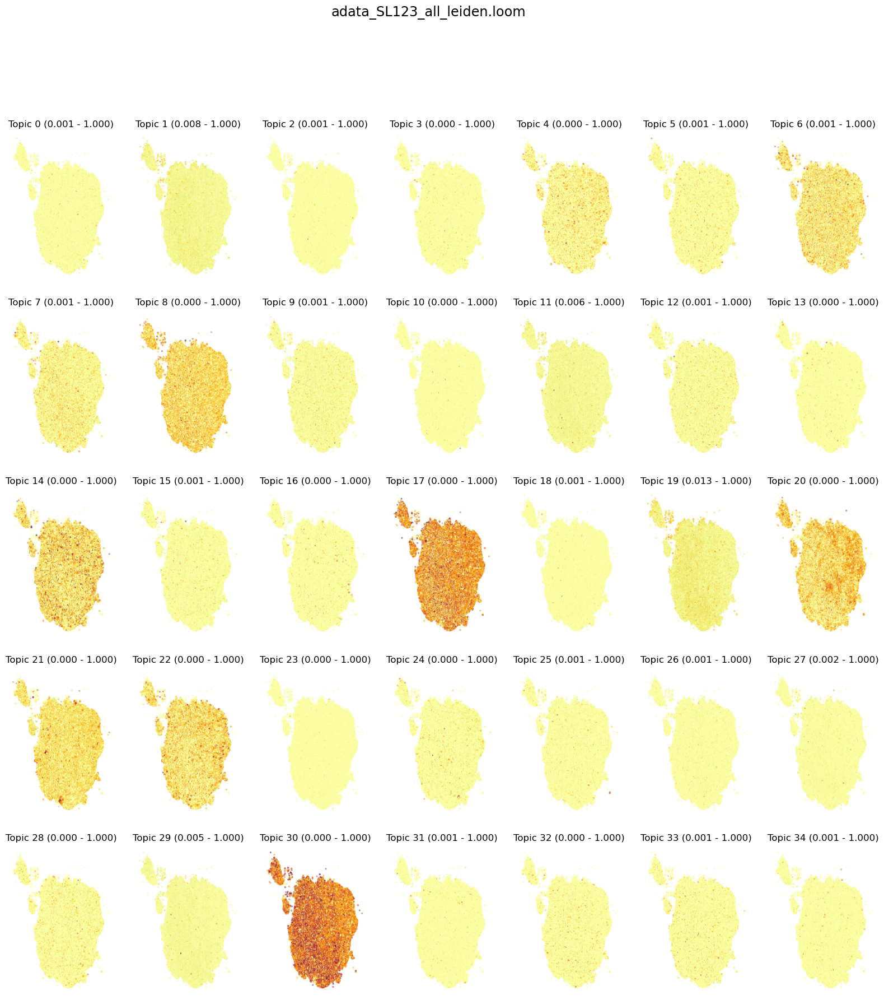

In [8]:
loompath = 'adata_SL123_all_leiden.loom'
outfolder = None #modelname + '/' + str(k)
selected_genes_file = None #os.path.basename(loompath).replace(".loom","") + '_selected_genes.tsv'
transformed = get_loadings(modelfolder, modelname, k, loompath, True, selected_genes_file)
colorize_xenium_replicates(transformed, loompath, outfolder)

Calculating loadings ...
Shape of adata_M108_all_leiden.loom: (541, 96699)
306 selected genes x 96699 cells
Done.
Saving topic loading in adata_M108_all_leiden.loom as col attr TP_35_Recombined3Clean2_C_FBPC


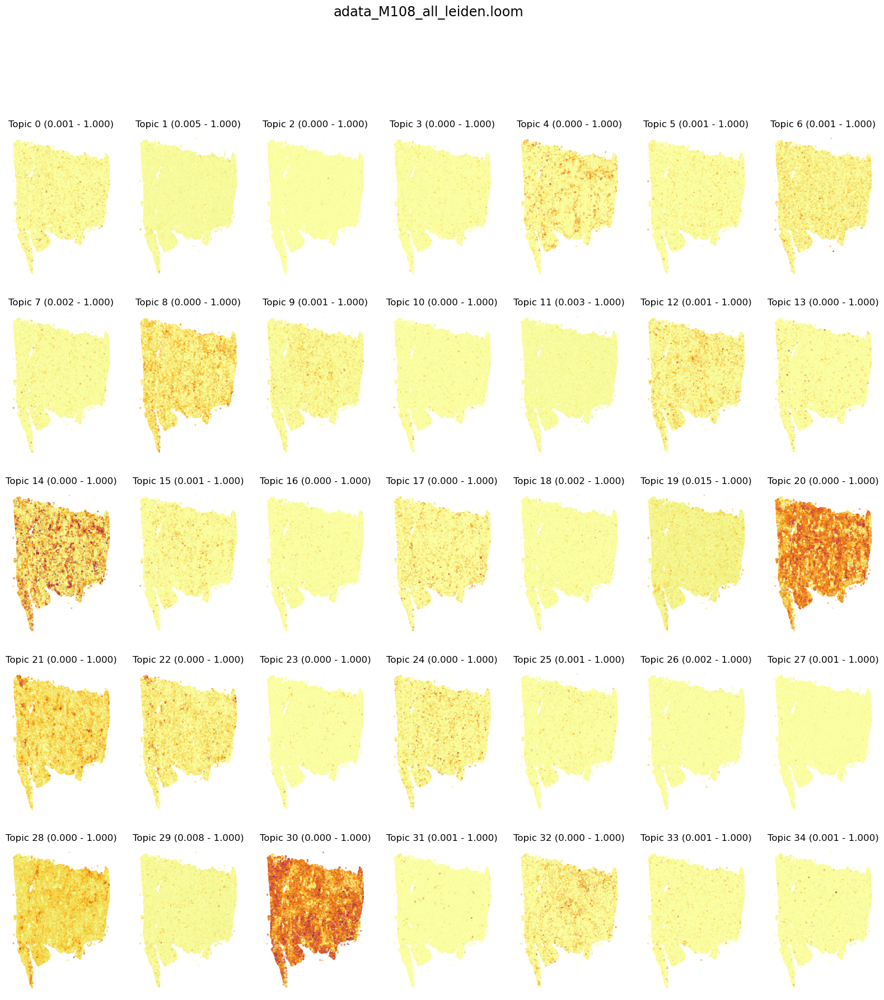

In [9]:
loompath = 'adata_M108_all_leiden.loom'
outfolder = None # modelname + '/' + str(k)
transformed = get_loadings(modelfolder, modelname, k, loompath, True)
colorize_xenium_replicates(transformed, loompath, outfolder)

Calculating loadings ...
Shape of adata_M47_all_leiden.loom: (541, 86488)
306 selected genes x 86488 cells
Done.
Saving topic loading in adata_M47_all_leiden.loom as col attr TP_35_Recombined3Clean2_C_FBPC


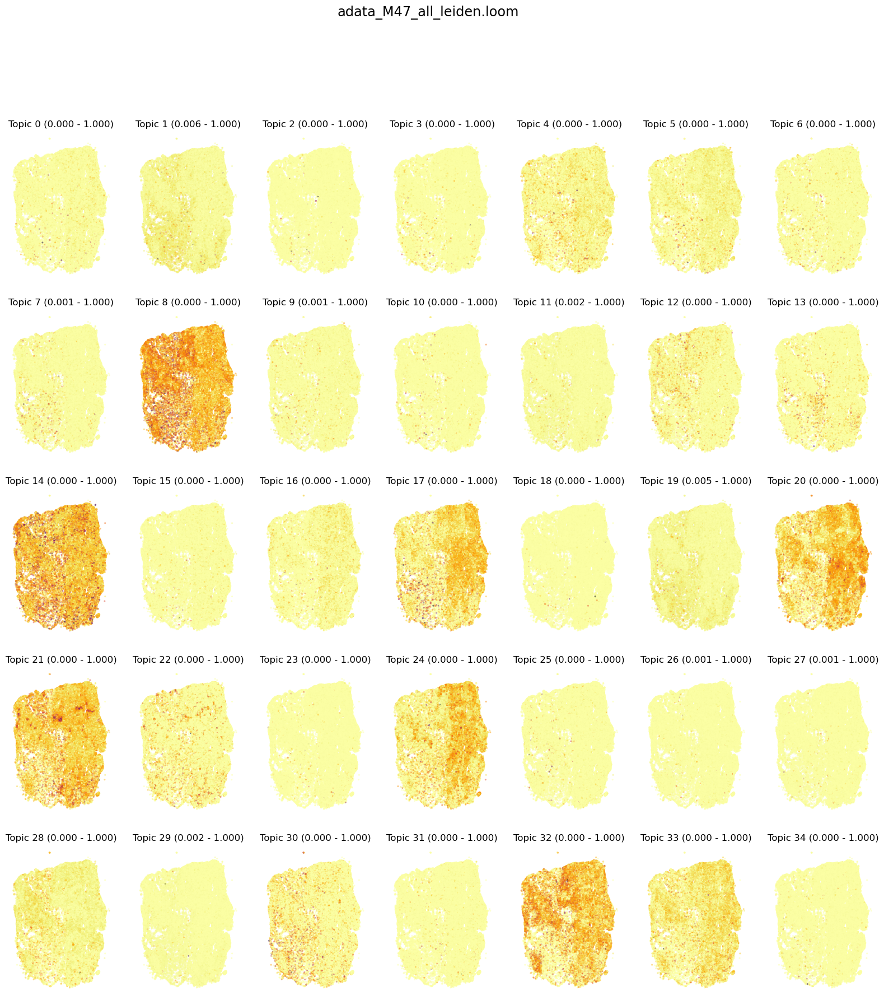

In [10]:
loompath = 'adata_M47_all_leiden.loom'
outfolder = None # modelname + '/' + str(k)
transformed = get_loadings(modelfolder, modelname, k, loompath, True)
colorize_xenium_replicates(transformed, loompath, outfolder)

Calculating loadings ...
Shape of adata_M73_2_all_leiden.loom: (541, 107178)
306 selected genes x 107178 cells
Done.
Saving topic loading in adata_M73_2_all_leiden.loom as col attr TP_35_Recombined3Clean2_C_FBPC


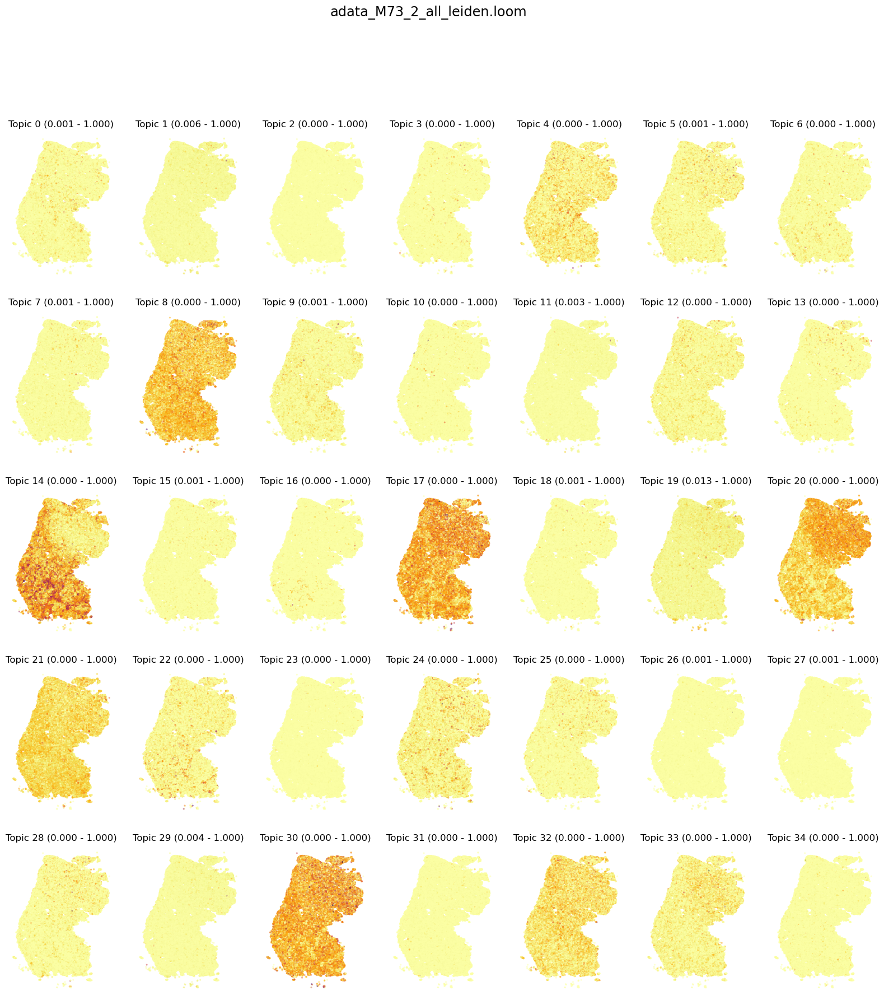

In [11]:
loompath = 'adata_M73_2_all_leiden.loom'
outfolder = None #modelname + '/' + str(k)
transformed = get_loadings(modelfolder, modelname, k, loompath, True)
colorize_xenium_replicates(transformed, loompath, outfolder)

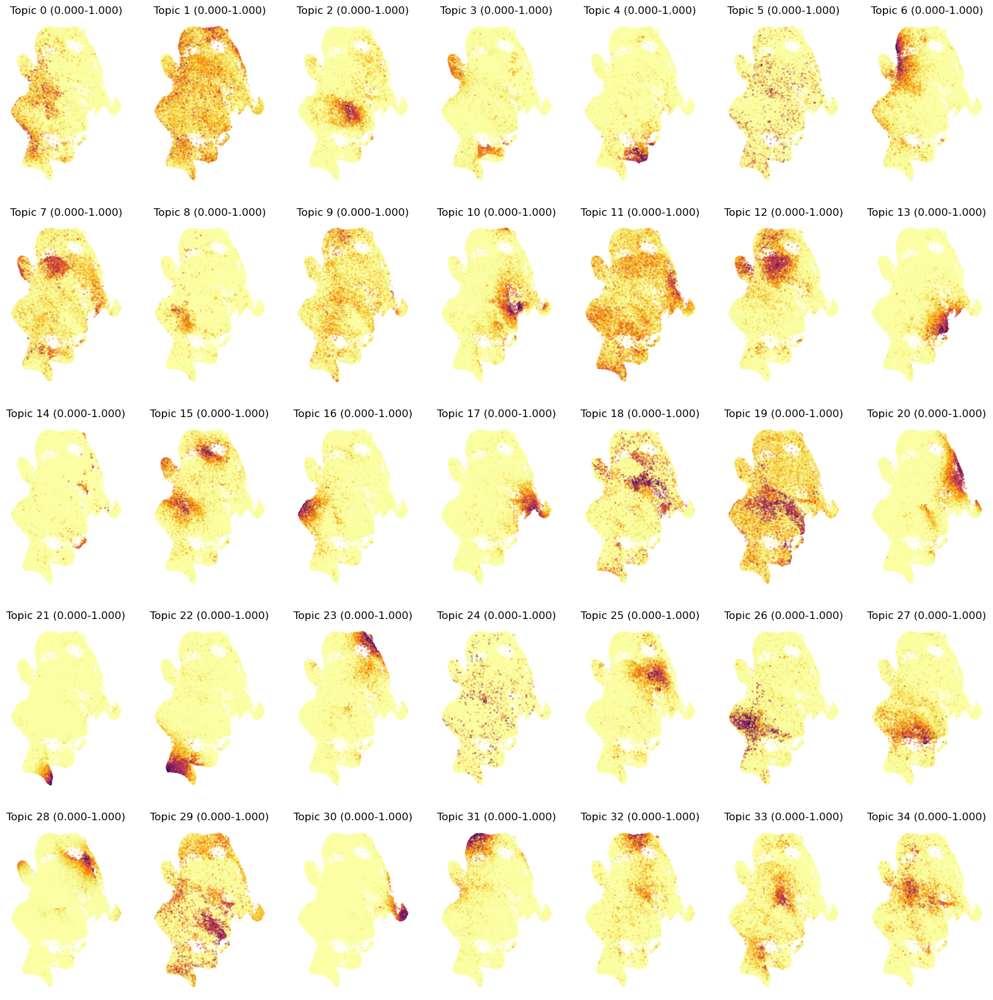

In [12]:
loompath = 'HumanAdult_Recombined3Clean2_C_FBPC.loom'
outfolder = None #modelname + '/' + str(k)
transformed = get_loadings(modelfolder, modelname, k, loompath)
colorize_umap(transformed, loompath, outfolder)

Replicates to colorize: ['dev_HE27a']


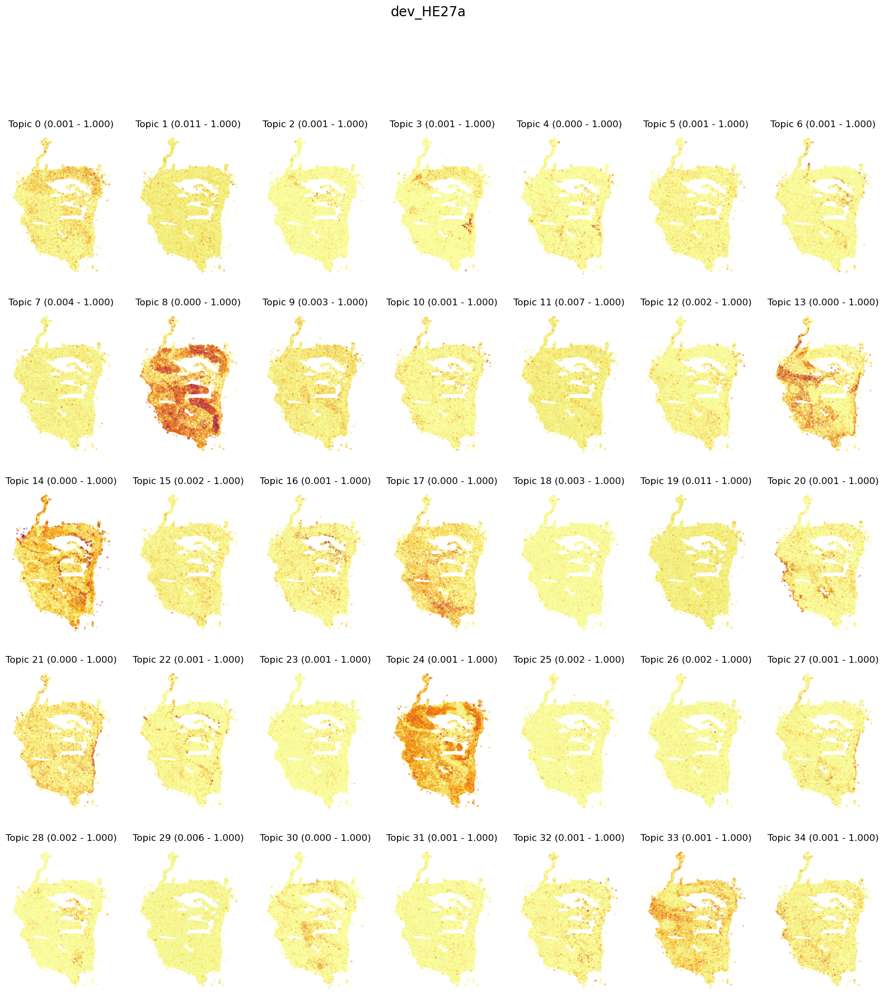

In [14]:
loompath = 'adata_dev_meninges_he27_pcw6_final_clusters_EE_dev_HE27a.loom'
outfolder = None #modelname + '/' + str(k)
transformed = get_loadings(modelfolder, modelname, k, loompath)
colorize_xenium_replicates(transformed, loompath, outfolder)

In [16]:
# Code below only to create loom files' topic model loading column attribute:
loompath = 'adata_meningioma_M99.loom'
transformed = get_loadings(modelfolder, modelname, k, loompath, True)

Calculating loadings ...
Shape of adata_meningioma_M99.loom: (389, 177771)
306 selected genes x 177771 cells
Done.
Saving topic loading in adata_meningioma_M99.loom as col attr TP_35_Recombined3Clean2_C_FBPC


In [17]:
loompath = 'adata_meningioma_M89.loom'
transformed = get_loadings(modelfolder, modelname, k, loompath, True)

Calculating loadings ...
Shape of adata_meningioma_M89.loom: (389, 334611)
306 selected genes x 334611 cells
Done.
Saving topic loading in adata_meningioma_M89.loom as col attr TP_35_Recombined3Clean2_C_FBPC


In [18]:
loompath = 'adata_meningioma_M73.loom'
transformed = get_loadings(modelfolder, modelname, k, loompath, True)

Calculating loadings ...
Shape of adata_meningioma_M73.loom: (389, 191374)
306 selected genes x 191374 cells
Done.
Saving topic loading in adata_meningioma_M73.loom as col attr TP_35_Recombined3Clean2_C_FBPC
